# The challenge



<img src="images/Kaggle_competition_britisch_birdsongs.jpg">

# The Tasks:
 ### 1. Can you build a classifier to identify birds based on their songs?
 ### 2. Can you visualize the songs of specific birds?
 ### 3. Can you generate new birdsongs based on this data?
 
 

In [1]:

# numeric and data handeling modules
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt


# Handeling of audiofiles
import librosa
import librosa.display
import soundfile as sf
from mpl_toolkits.mplot3d import Axes3D

# ML modules
import sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.mixture import BayesianGaussianMixture
from sklearn.model_selection import train_test_split
from sklearn import preprocessing, metrics, model_selection, neural_network, linear_model, ensemble

import tensorflow as tf

import umap

# Diverse utilities modules
import os
from random import randint
from itertools import zip_longest
import IPython.display as apd
from time import time


In [2]:
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

In [1]:
# from itertools import zip_longest

# from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score
# from sklearn.mixture import GaussianMixture
# from sklearn.mixture import BayesianGaussianMixture
# from sklearn.model_selection import train_test_split

# import tensorflow as tf

# from mpl_toolkits.mplot3d import Axes3D

# from sklearn import preprocessing, metrics, model_selection, neural_network, linear_model, ensemble
# import matplotlib.pyplot as plt
# from scipy import stats


## Load and read what the metadata file contains

In [4]:
df = pd.read_csv(os.path.join(os.path.abspath('.'), 
                                        "input", 
                                        "birdsong_metadata.csv"))
df.head()

,file_id,genus,species,english_cname,who_provided_recording,country,latitude,longitute,type,license
0,132608,Acanthis,flammea,Common Redpoll,Jarek Matusiak,Poland,50.7932,15.4995,"female, male, song",http://creativecommons.org/licenses/by-nc-sa/3.0/
1,132611,Acanthis,flammea,Common Redpoll,Jarek Matusiak,Poland,50.7932,15.4995,"flight call, male, song",http://creativecommons.org/licenses/by-nc-sa/3.0/
2,35068,Acanthis,flammea,Common Redpoll,Sander Bot,Netherlands,52.8176,6.4326,"call, song",http://creativecommons.org/licenses/by-nc-nd/2.5/
3,82715,Acrocephalus,palustris,Marsh Warbler,Dougie Preston,United Kingdom,60.3539,-1.2689,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/
4,64685,Acrocephalus,palustris,Marsh Warbler,Dougie Preston,United Kingdom,60.3539,-1.2689,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/


In [5]:
df[df["species"] == "philomelos"]

,file_id,genus,species,english_cname,who_provided_recording,country,latitude,longitute,type,license
258,96608,Turdus,philomelos,Song Thrush,Fraser Simpson,United Kingdom,51.6360,-0.3280,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/
259,132392,Turdus,philomelos,Song Thrush,david m,United Kingdom,54.1200,-0.5445,song,http://creativecommons.org/licenses/by-nc-nd/3.0/
260,146756,Turdus,philomelos,Song Thrush,David Darrell-Lambert,United Kingdom,51.6608,0.0031,song,http://creativecommons.org/licenses/by-nc-sa/3.0/


In [6]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   file_id                 264 non-null    int64  
 1   genus                   264 non-null    object 
 2   species                 264 non-null    object 
 3   english_cname           264 non-null    object 
 4   who_provided_recording  264 non-null    object 
 5   country                 264 non-null    object 
 6   latitude                261 non-null    float64
 7   longitute               261 non-null    float64
 8   type                    264 non-null    object 
 9   license                 264 non-null    object 
dtypes: float64(2), int64(1), object(7)
memory usage: 20.8+ KB


In [7]:
my_id = 132392
my_file_id = df[df["file_id"] == my_id]
print(f"file_id : {my_id}\ncommon bird name: {my_file_id.english_cname.values}\nscientific name {my_file_id.genus.values + ' ' + my_file_id.species.values}")

file_id : 132392
common bird name: ['Song Thrush']
scientific name ['Turdus philomelos']


##  Listening to some audio files

In [8]:
# Define the path where the audios are located
audio_path = os.path.join(os.path.abspath('.'),
                          "input",
                          "songs",
                          "songs")


In [9]:
data, samplerate = sf.read(os.path.join(audio_path, 
                      "xc"+str(my_id)+".flac"))
print(f"Size of the audio file {data.shape[0]}\nSample rate: {samplerate}");
apd.Audio(os.path.join(audio_path, 
                      "xc"+str(my_id)+".flac"))

Size of the audio file 11059190
Sample rate: 44100


##  Visualizing the audio records

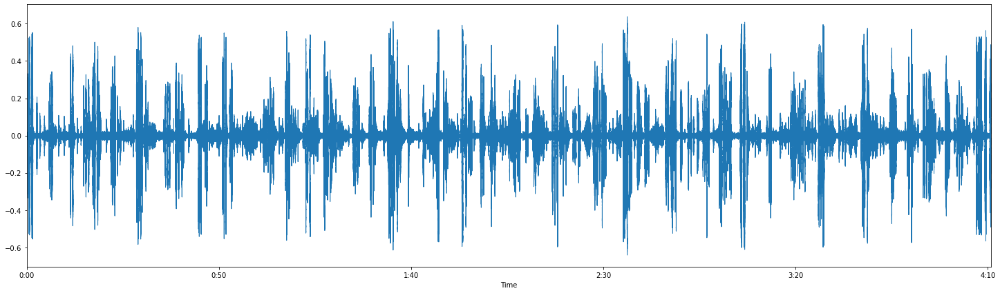

In [10]:
trim_data, _ = librosa.effects.trim(data)
fig, ax = plt.subplots(figsize=(25,7))

librosa.display.waveplot(y = trim_data, sr = samplerate)

In [11]:
def process_my_raw_data(data_array, hop_l = 512):
#     n_fft = int(6.144000e+03) # FFT window size
#     hop_length = 512 # number audio of frames between STFT columns (looks like a good default)
    FFT_data = np.abs(librosa.stft(data_array, hop_length = hop_l))
    DB_data = librosa.amplitude_to_db(FFT_data, ref = np.max)
    return (DB_data)
    

Text(0.5, 1.0, 'Spectrogram')

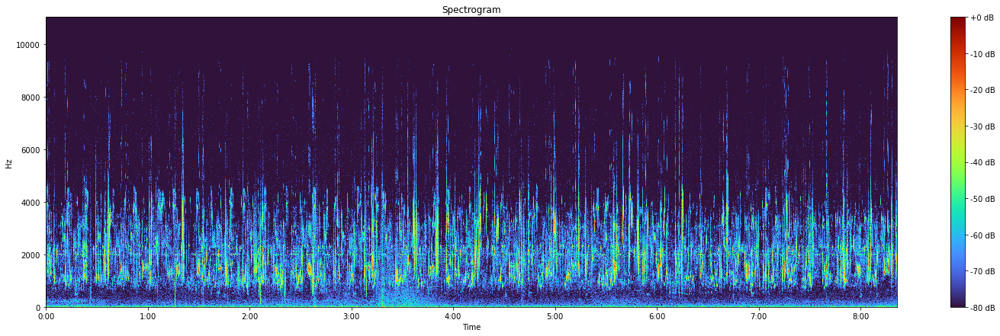

In [12]:
fig, ax = plt.subplots(figsize=(25,7))

librosa.display.specshow(process_my_raw_data(trim_data), 
                         y_axis='linear', 
                         x_axis='time',
                         cmap = 'turbo')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
# plt.ylim([1024, 8200])

## Define a function to read and preprocess the audiofiles

In [13]:
def load_audio(path, file_id):
    # Read the aufdiofile in format .flac
    data, samplerate = sf.read(path+ "/xc"+str(file_id)+".flac")
    # determine the duration of the file
    s = len(data)/samplerate
    # compute and extract the melspectrogram
    sg = librosa.feature.melspectrogram(data, sr=samplerate, hop_length=512)#"hope_length", from the documentation -> "number of samples between successive frames"
    
    # Take mean amplitude M from frame with highest energy
    centerpoint = np.argmax(sg.mean(axis=0))
    M = sg[:,centerpoint].mean()
    
    # Filter out all frames with energy less than 5% of M
    mask = sg.mean(axis=0)>=M/20

    audio_mask = np.zeros(len(data), dtype=bool)
    for i in range(0,len(mask)):
        audio_mask[i*512:] = mask[i]
    # return the mel-spect, filtered high-pass mel-spect mask, raw data, raw_data mask and samplerate
    return sg, mask, data, audio_mask, samplerate

In [14]:
# We create a Dictionary with files_ID keys containing the arrays with the filtered record of the audiosignal
# and populate a new column to the dataframe with the lenght (duration) of the audio audiosignal

df['length'] = np.zeros(len(df))

waves = {}


for file_id in df['file_id']:
    sg, mask, data, audio_mask, sample_rate = load_audio(path = audio_path, file_id = file_id)
    waves[file_id] = data[audio_mask]
    df.loc[df['file_id'] == file_id,'length'] = len(data[audio_mask])
#     print(len(data[audio_mask])/sample_rate)

In [15]:
df.head()

,file_id,genus,species,english_cname,who_provided_recording,country,latitude,longitute,type,license,length
0,132608,Acanthis,flammea,Common Redpoll,Jarek Matusiak,Poland,50.7932,15.4995,"female, male, song",http://creativecommons.org/licenses/by-nc-sa/3.0/,256512.0
1,132611,Acanthis,flammea,Common Redpoll,Jarek Matusiak,Poland,50.7932,15.4995,"flight call, male, song",http://creativecommons.org/licenses/by-nc-sa/3.0/,52736.0
2,35068,Acanthis,flammea,Common Redpoll,Sander Bot,Netherlands,52.8176,6.4326,"call, song",http://creativecommons.org/licenses/by-nc-nd/2.5/,47104.0
3,82715,Acrocephalus,palustris,Marsh Warbler,Dougie Preston,United Kingdom,60.3539,-1.2689,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/,152576.0
4,64685,Acrocephalus,palustris,Marsh Warbler,Dougie Preston,United Kingdom,60.3539,-1.2689,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/,94720.0


###  Inspect the lenght of audio files

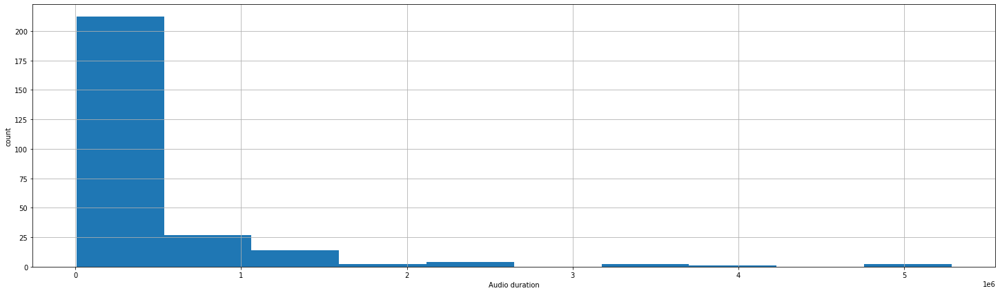

count    2.640000e+02
mean     4.307551e+05
std      6.611081e+05
min      6.144000e+03
25%      1.000960e+05
50%      2.373120e+05
75%      4.424960e+05
max      5.286262e+06
Name: length, dtype: float64

In [16]:
fig, ax = plt.subplots(figsize=(25,7))
df['length'].hist()
plt.ylabel('count')
plt.xlabel('Audio duration')
plt.show()

df['length'].describe()

In [17]:
# We set window to 6.144000e+03 frames as it's the minimum length among our audio files
df['windows'] = df['length'].apply(lambda x: int(x/6.144000e+03))
df.head()

,file_id,genus,species,english_cname,who_provided_recording,country,latitude,longitute,type,license,length,windows
0,132608,Acanthis,flammea,Common Redpoll,Jarek Matusiak,Poland,50.7932,15.4995,"female, male, song",http://creativecommons.org/licenses/by-nc-sa/3.0/,256512.0,41
1,132611,Acanthis,flammea,Common Redpoll,Jarek Matusiak,Poland,50.7932,15.4995,"flight call, male, song",http://creativecommons.org/licenses/by-nc-sa/3.0/,52736.0,8
2,35068,Acanthis,flammea,Common Redpoll,Sander Bot,Netherlands,52.8176,6.4326,"call, song",http://creativecommons.org/licenses/by-nc-nd/2.5/,47104.0,7
3,82715,Acrocephalus,palustris,Marsh Warbler,Dougie Preston,United Kingdom,60.3539,-1.2689,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/,152576.0,24
4,64685,Acrocephalus,palustris,Marsh Warbler,Dougie Preston,United Kingdom,60.3539,-1.2689,Song,http://creativecommons.org/licenses/by-nc-nd/2.5/,94720.0,15


### NOTE: If working with the full dataset, the next 4 cells can go away...

In [18]:
#compute the sum of total windows for species
df.groupby(["genus",'species'])['windows'].sum().to_frame().sort_values("windows")

,,windows
genus,species,
Motacilla,flava,20
Perdix,perdix,23
Calidris,alpina,37
Sylvia,curruca,38
Muscicapa,striata,40
...,...,...
Locustella,fluviatilis,671
Chroicocephalus,ridibundus,777
Acrocephalus,schoenobaenus,1049


In [19]:
# We'll consider the genus + species as the label 
# We use 20 windows per genus + species to have a balanced data set

n_windows = df.groupby(["genus",'species'])['windows'].sum().min()
n_windows

20

In [20]:
# We create all windows for each file and partition them by species

windows = {}

for file_id in df['file_id']:
    wave = waves[file_id]
    species = df[df['file_id']==file_id]['genus'].values[0] + "_" + df[df['file_id']==file_id]['species'].values[0]
    if species not in windows:
        windows[species] = []
    for i in range(0, int(len(wave)/6.144000e+03)):
        windows[species].append(wave[i:int(i+6.144000e+03)])
        



In [21]:
# We randomly pick 20 windows for each species

# Save other samples for testing

windows_fixed = {}
windows_fixed_test = {}

for species in windows.keys():
    windows_fixed[species] = []
    windows_fixed_test[species] = []
    ws = windows[species]
    index = np.random.choice(len(ws), n_windows, replace=False)
    for i in range(0, len(ws)):
        if i in index:
            windows_fixed[species].append(ws[i])
        else:
            windows_fixed_test[species].append(ws[i])

In [22]:
print(len(windows['Acanthis_flammea']), len(windows_fixed['Acanthis_flammea']), len(windows_fixed_test['Acanthis_flammea']))

56 20 36


# Spectral centroid
The spectral centroid is a measure used in digital signal processing to characterise a spectrum. It indicates where the center of mass of the spectrum is located. Perceptually, it has a robust connection with the impression of brightness of a sound.

*Source: Wikipedia*

## Visualizing the centroids for a given Window

In [23]:
# Take a given window from the fixed Window_20
my_window_indx = 3
my_species_name = "Turdus_philomelos"
my_window = windows_fixed[my_species_name][my_window_indx]

In [24]:
my_window.shape

(6144,)

In [25]:
sample_rate

44100

In [26]:
def process_my_raw_data(data_array, hop_l = 512):
#     n_fft = int(6.144000e+03) # FFT window size
#     hop_length = 512 # number audio of frames between STFT columns (looks like a good default)
    FFT_data = np.abs(librosa.stft(data_array, hop_length = hop_l))
    DB_data = librosa.amplitude_to_db(FFT_data, ref = np.max)
    return (DB_data)
    

No handles with labels found to put in legend.
C:\Users\valer\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\valer\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\valer\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


[Text(0.5, 1.0, 'log Power spectrogram')]

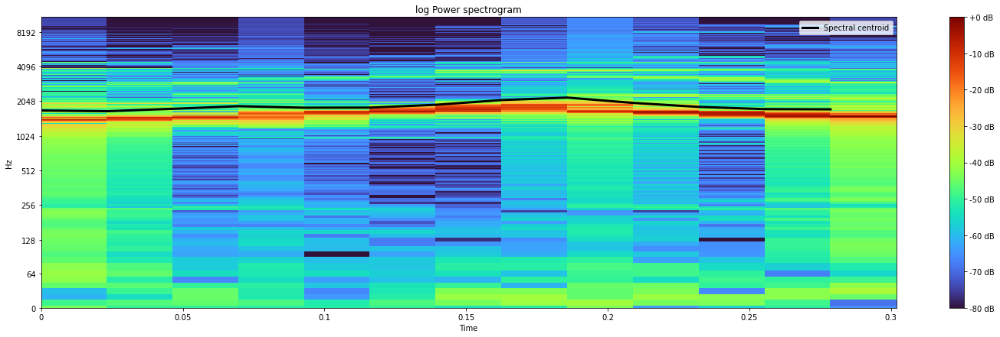

In [28]:
# Compute short time Fourier transforms and stract magnitude (S) component
S, _ = librosa.magphase(librosa.stft(y=my_window))
# # # compute the centroid
cent = librosa.feature.spectral_centroid(S=S)
# # # fix the time to be in s
times = librosa.times_like(cent)


fig, ax = plt.subplots(figsize=(25,7))
ax.legend(loc='upper right')
ax.set(title='Spectrogram')

librosa.display.specshow(process_my_raw_data(my_window),
                         y_axis='log', 
                         x_axis='time',
                         cmap = 'turbo')

plt.colorbar(format='%+2.0f dB')

ax.plot(times, cent.T, label='Spectral centroid', color='k', linewidth= 3)
ax.legend(loc='upper right')
ax.set(title='log Power spectrogram')

# Chroma feature
In Western music, the term chroma feature or chromagram closely relates to the twelve different pitch classes. Chroma-based features, which are also referred to as "pitch class profiles", are a powerful tool for analyzing music whose pitches can be meaningfully categorized (often into twelve categories) and whose tuning approximates to the equal-tempered scale. One main property of chroma features is that they capture **harmonic** and **melodic** characteristics of music, while being robust to changes in timbre and instrumentation. 

*Source: Wikipedia*

## Visualizing the chroma spectrum for a given Window



[Text(0.5, 1.0, 'Chromagram')]

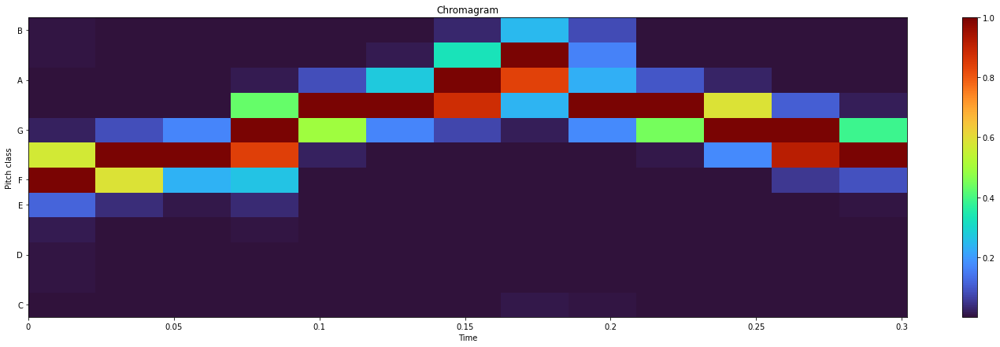

In [29]:
fig, ax = plt.subplots(figsize=(25,7))

chroma = librosa.feature.chroma_stft(y=my_window, sr=sample_rate)
img = librosa.display.specshow(chroma, 
                               y_axis='chroma', 
                               x_axis='time',
                               cmap = 'turbo',
                               ax=ax)

fig.colorbar(img, ax=ax)

ax.set(title='Chromagram')

#  Actual features extraction

In [27]:
# Extract ALL FEATURES in a single dataset

full_dataset = pd.DataFrame()# this is the same as train.csv dataset

for species in windows.keys():
    for i in range(0,len(windows[species])):
        data_point = {'species':species.split('_')[1], 'genus':species.split('_')[0]}
        spec_centroid = librosa.feature.spectral_centroid(windows[species][i])[0]
        chroma = librosa.feature.chroma_stft(windows[species][i], sample_rate)
        for j in range(0,13):
            data_point['spec_centr_'+str(j)] = spec_centroid[j]
            for k in range(0,12):
                data_point['chromogram_'+str(k)+"_"+str(j)] = chroma[k,j]
        full_dataset = full_dataset.append(data_point,ignore_index=True)

full_dataset["id"] =np.arange(len(full_dataset))
full_dataset.head()

C:\Users\valer\anaconda3\lib\site-packages\librosa\core\pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")


,chromogram_0_0,chromogram_0_1,chromogram_0_10,chromogram_0_11,chromogram_0_12,chromogram_0_2,chromogram_0_3,chromogram_0_4,chromogram_0_5,chromogram_0_6,...,spec_centr_2,spec_centr_3,spec_centr_4,spec_centr_5,spec_centr_6,spec_centr_7,spec_centr_8,spec_centr_9,species,id
0,1.000000,0.945011,0.749241,0.714737,0.704973,0.311386,0.881971,0.280575,0.519973,0.170108,...,2731.690852,2611.073050,2702.003239,2675.278371,2817.586465,2708.632712,2738.029229,2688.206937,flammea,0
1,0.650246,0.590960,0.712450,0.909643,0.727013,0.502476,1.000000,0.242925,0.337245,0.167843,...,2731.547261,2610.927066,2702.182804,2675.414141,2817.691747,2708.316600,2738.381422,2687.759667,flammea,1
2,1.000000,0.833207,0.770394,0.702116,0.655413,0.326867,0.922793,0.313101,0.493068,0.167065,...,2731.402739,2610.782384,2702.360650,2675.551162,2817.795119,2708.001040,2738.732679,2687.312298,flammea,2
3,0.991786,0.829836,0.769562,0.702360,0.658253,0.327552,0.923582,0.312167,0.492926,0.167125,...,2731.257287,2610.638982,2702.536771,2675.689443,2817.896599,2707.686043,2739.083006,2686.864803,flammea,3
4,0.982724,0.826884,0.768729,0.702757,0.662904,0.328242,0.924370,0.311240,0.492785,0.167188,...,2731.110902,2610.496832,2702.711165,2675.828996,2817.996189,2707.371617,2739.432407,2686.417165,flammea,4


In [28]:
# full_dataset.info(verbose=True, show_counts= True)
full_dataset.shape

(18386, 172)

In [29]:
# Export CSV file with the features of the full dataset
full_dataset.to_csv(os.path.join(os.path.abspath('.'),
                                 "data",
                                 "all.csv"),index=None)

In [2]:
full_dataset=pd.read_csv('W:\\Project Revolution shared drive\\ADS_CAS_Bern_2020\\Projects\\M3\\Birds New Project\\ADS_CAS_Bern_2020\\Projects\\M3\\new_project\data\\all.csv')

# Inspection and data splitting

In [3]:
#Capturing the columns names
features = list(full_dataset.columns)

### We take only column names containing features

In [4]:
features.remove("id")
features.remove("genus")
features.remove("species")

In [5]:
# add a column with the correct species name
full_dataset['full_sp_name'] = full_dataset['genus'] + '_' + full_dataset['species']

'There are 88 species in the Full dataset'

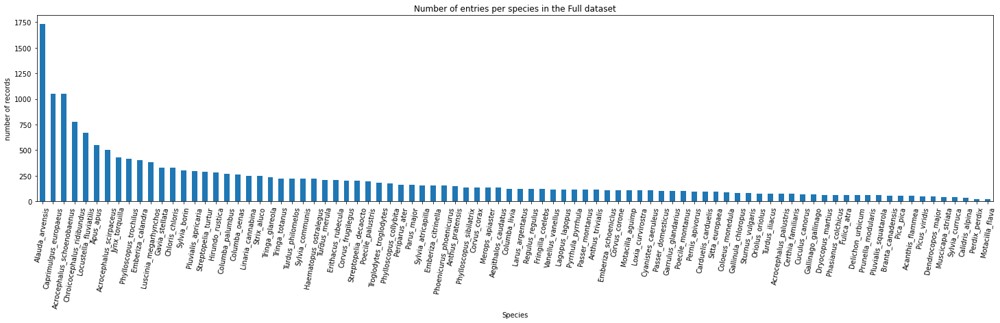

In [7]:
fig, ax = plt.subplots(figsize=(25,5))
full_dataset['full_sp_name'].value_counts().plot.bar(ax=ax)
plt.title("Number of entries per species in the Full dataset" )
plt.xlabel('Species')
plt.xticks(rotation=80)
plt.ylabel('number of records');
plt.show
f"There are {len(full_dataset.full_sp_name.unique())} species in the Full dataset"

## Scale/standarize dataset and encode labels

In [8]:
scaler = preprocessing.StandardScaler()# Declare an instance of the transformer/scaler
scaler.fit(full_dataset[features])# Compute the transformation

full_dataset[features] = pd.DataFrame(scaler.transform(full_dataset[features]), columns=features)# Transform (scale) the features on the train_df

##  We split and take 70% of the data that goes to the train

In [11]:
X_train, X, Y_train, Y = train_test_split(full_dataset[features], full_dataset['full_sp_name'], test_size=0.3, random_state=1000, stratify=full_dataset['full_sp_name'])

In [14]:
print(f"shape of train data: X_train = {X_train.shape}, Y_train = {Y_train.shape}\nshape of X data: X = {X.shape}, Y = {Y.shape}")

shape of train data: X_train = (12870, 169), Y_train = (12870,)
shape of X data: X = (5516, 169), Y = (5516,)


##  The remaining 30% is splitted and 2/3 goes to validation and the rest will be unseen by the model an will go for final test

In [15]:
X_val, X_test, Y_val, Y_test = train_test_split(X, Y, test_size=0.66, random_state=1000, stratify=Y)

###  We will use now as:
   1. Validation  dataset-> `x_val`, `y_val`: we will run the model and asses accuraca on the model training with this dataset.
   2. Test dataset -> `x_test`, `y_test`: The model will never see this dataset until the end to see how perfomr with unkonw data.
   3. And the training dataset remains is taking below from the original dataframe.

In [16]:
print(f"shape of train data: x_train = {X_train.shape}, y_train = {X_train.shape}\nshape of test data: x_test = {X_test.shape}, y_test = {X_test.shape}\nshape of val data: x_val = {X_val.shape}, y_val = {X_val.shape}")

shape of train data: x_train = (12870, 169), y_train = (12870, 169)
shape of test data: x_test = (3641, 169), y_test = (3641, 169)
shape of val data: x_val = (1875, 169), y_val = (1875, 169)


In [17]:
# Define the training dataset.
x_train = X_train[features].values

y_train_raw = Y_train.values
le = preprocessing.LabelEncoder()# *** Help normalize labels (numeric or in this case strings) such that they contain only values between 0 and n_classes-1

y_train = le.fit_transform(y_train_raw)# Transform autput labels to numeric values.


# Define the test and validation datasets.

x_test = X_test.values
y_raw_test = Y_test.values

y_test = le.transform(y_raw_test)



x_val = X_val.values
y_val_test = Y_val.values

y_val = le.transform(y_val_test)

## Use PCA to show the dataset in a reduced space dimension

Explained variance ratio:  [0.175 0.141 0.119 0.059 0.054 0.037 0.032 0.023 0.020 0.020 0.018 0.015
 0.013 0.012 0.012 0.011 0.011 0.010 0.009 0.009 0.008 0.008 0.007 0.007
 0.007 0.006 0.006 0.005 0.005 0.005 0.005 0.005 0.005 0.004 0.004 0.004
 0.004 0.004 0.004 0.003 0.003 0.003 0.003 0.003 0.003 0.003 0.003 0.002
 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002
 0.002 0.002 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000 0.000
 0.000 0.000 0.000 0.000

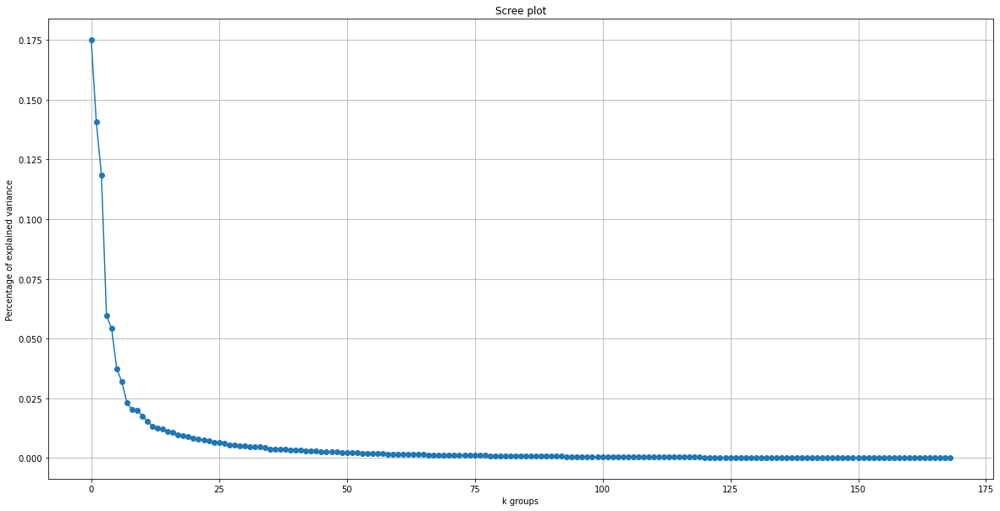

In [42]:
pca=PCA()
pca.fit(X)
fig, ax = plt.subplots(figsize=(20,10))
plt.plot(pca.explained_variance_ratio_,'-o')
plt.title('Scree plot')
plt.ylabel('Percentage of explained variance')
plt.xlabel('k groups')
plt.grid()
print('Explained variance ratio: ' ,pca.explained_variance_ratio_)
plt.show()

## Embedding the firts two components of the PCA

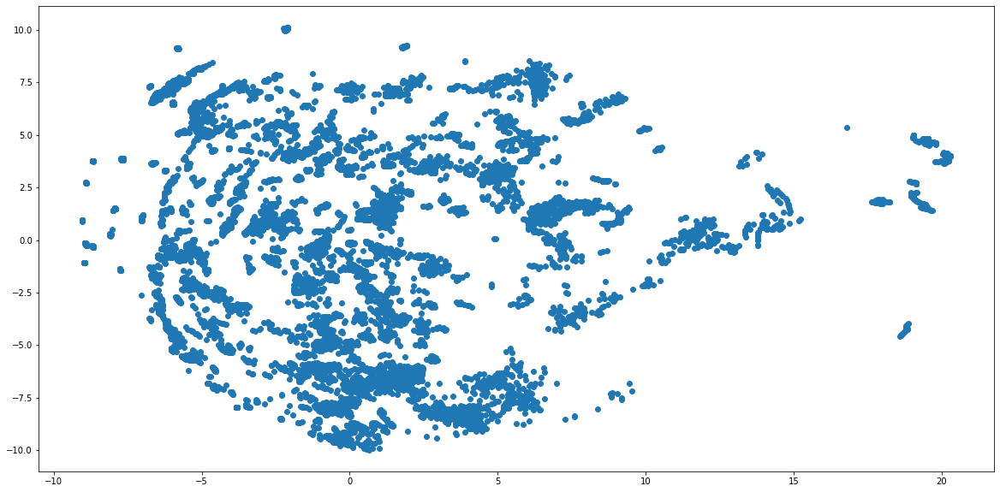

In [43]:
fig, ax = plt.subplots(figsize=(20,10))
X_pca = pca.transform(X_train)
plt.plot(X_pca[:,0],X_pca[:,1],'o')

## Use umap (UMAP) to show the dataset in a reduced space dimension

#### Use a helper function to visualize various parameters

In [59]:
def draw_umap(data, 
              n_neighbors=15, min_dist=0.1, 
              n_components=2, metric='euclidean', 
              title='', 
              plot_indx1 = 4, plot_indx2 = 4, plot_grid_size = 1, 
              font_s = 20,
              scat_s = 10):
    
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric,
        random_state=9991
        
    )
    
    t0 = time()
    u = fit.fit_transform(data);
    t1 = time()

    if n_components == 1:
        ax = fig.add_subplot(plot_indx1, plot_indx2, plot_grid_size)
        ax.scatter(u[:,0], range(len(u)))
    if n_components == 2:
        ax = fig.add_subplot(plot_indx1, plot_indx2, plot_grid_size)
        ax.scatter(u[:,0], u[:,1], s=scat_s)
    if n_components == 3:
        ax = fig.add_subplot(plot_indx1, plot_indx2, plot_grid_size, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2],  s=scat_s)
    plt.title(title + f"\nelapsed time: {t1 - t0:.2f}", fontsize=font_s)


### Exploring different neighbors and minimal distance (hyperparameter landscape)

#### Extractting 2 components

In [64]:
# Run me only locally
components = 2
neigbords = [5, 10, 50, 100, 200]
distance = [0.1, 0.25, 0.5, 0.8, 0.99]

fig_Count = 0
nrows, ncols = len(neigbords), len(distance)

fig = plt.figure(figsize=(60, 60))

for indx1, n  in enumerate(neigbords, start=1):
    for indx2, d in enumerate(distance, start=1):
        fig_Count += 1
#         print(f"this is my neigb: {i} and this is my distance {j} and index1: {indx1} and index2: {indx2}")
        draw_umap(data = X_train,
                  min_dist=d, 
                  n_neighbors=n,
                  n_components= components, 
                  title=f'min_dist = {d} and neigbords {n}',
                  plot_indx1 = nrows, plot_indx2 = ncols, plot_grid_size = fig_Count)

fig.tight_layout(pad=3)

AttributeError: module 'umap' has no attribute 'UMAP'

<Figure size 4320x4320 with 0 Axes>

## Use TSNE to show the dataset in a reduced space dimension

#### Use a helper function to visualize various parameters

In [65]:
def draw_TSNE(data,
              n_perplex=125, 
              learn_rate=200, 
              early_exag=4.0,
              init='pca',
              n_itera=1000, 
              metric='euclidean', 
              verbo=100,
              title='', 
              plot_indx1 = 4, plot_indx2 = 4, plot_grid_size = 1, 
              font_s = 20,
              scat_s = 10):
    
    
    fit = TSNE(perplexity=n_perplex, 
               learning_rate=learn_rate, 
               early_exaggeration=early_exag,
               init=init,
               n_iter=n_itera, 
               random_state=9999991, 
               metric=metric, 
               verbose=0 )
    
    t0 = time()
    u = fit.fit_transform(data);
    t1 = time()

    ax = fig.add_subplot(plot_indx1, plot_indx2, plot_grid_size)
    ax.scatter(u[:,0], u[:,1], s=scat_s)
    
    plt.title(title + f"\nelapsed time: {t1 - t0:.2f}", fontsize=font_s)


KeyboardInterrupt: 

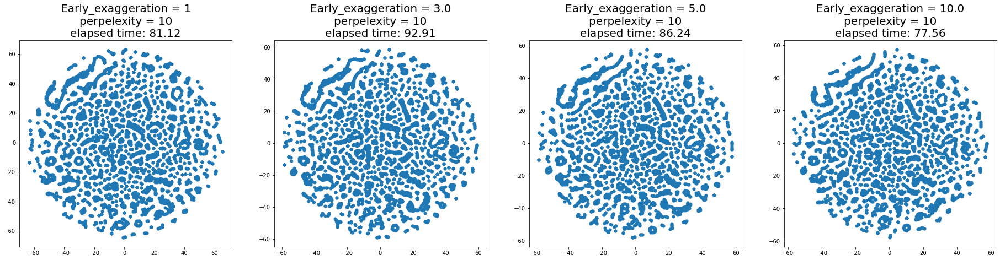

In [67]:
# Run me only locally

learning_rate=200
itera=500

perplexity=[10, 30, 50, 100, 150]
exagg=[1, 3.0, 5.0, 10.0, 15.0]



fig_Count = 0
nrows, ncols = len(perplexity), len(exagg)

fig = plt.figure(figsize=(40, 40))

for indx1, p  in enumerate(perplexity, start=1):
    for indx2, e in enumerate(exagg, start=1):
        fig_Count += 1
#         print(f"this is my neigb: {i} and this is my distance {j} and index1: {indx1} and index2: {indx2}")
        draw_TSNE(data = X_train,
                  n_perplex=p, 
                  learn_rate=learning_rate, 
                  early_exag=e,
                  n_itera=itera,
                  title=f'Early_exaggeration = {e}\nperpelexity = {p}',
                  plot_indx1 = nrows, plot_indx2 = ncols, plot_grid_size = fig_Count,
                  font_s = 20, scat_s = 20)



## Exploring the optimal numbers of clusters via K-means

In [39]:
# Run me only locally

plt.figure(figsize=(20, 10))
scores=[]
clusters = 200


for itrial in range(2,clusters):
#     print('Number of clusters considered: ',itrial)
    clusterer = KMeans(n_clusters=itrial, random_state=10)
    cluster_labels = clusterer.fit_predict(X_train)
    score=silhouette_score(X_train,cluster_labels)
    scores.append(score)
    
plt.grid()
plt.plot(np.arange(len(scores))+2,np.array(scores),'-o')
plt.ylabel('Silohuette score');
plt.xlabel('number of clusters');

KeyboardInterrupt: 

<Figure size 1440x720 with 0 Axes>

### Assesing Gaussian mixture for classification

In [ ]:
# # No need to run this code
# n_rows, n_cols = list(range(1, 5)), list(range(1, 5))
# start, end = 80, 96

# aic=[]
# bic=[]
# sil=[]

# scat_s = 20
# font_s = 20
# fig = plt.figure(figsize=(60, 60))

# for indx, i_comp in enumerate(range(start, end), start = 1):
#     ax = fig.add_subplot(len(n_rows), len(n_cols), indx)
    
#     clf =  GaussianMixture(n_components=i_comp, covariance_type='full')
    
    
# #     u = clf.fit_transform(X);
    
#     t0 = time()
#     clf.fit(X)
#     cluster_labels=clf.predict(X)
#     t1 = time()
    
#     ax.scatter(X[:,0], X[:,1], c = cluster_labels, s = scat_s)
#     plt.title(f"components: {i_comp}\nelapsed time :{t1 - t0:.2f}\nIC: {clf.aic(X):.2f}\nBIC: {clf.bic(X):.2f}\nSilhouette_score: {silhouette_score(X,cluster_labels):.2f}", fontsize = font_s)
    


In [ ]:
# plt.figure(figsize=(20, 10))
# scat_s = 20
# font_s = 20
# i_comp = 85
    
# clf =  GaussianMixture(n_components=i_comp, covariance_type='full')
    
    
# # u = clf.fit_transform(X);
    
# t0 = time()
# clf.fit(X)
# cluster_labels=clf.predict(X)
# t1 = time()


# plt.scatter(X[:,0], X[:,1], c = cluster_labels, s = scat_s)
# plt.title(f"components: {i_comp}\nelapsed time :{t1 - t0:.2f}\nIC: {clf.aic(X):.2f}\nBIC: {clf.bic(X):.2f}\nSilhouette_score: {silhouette_score(X,cluster_labels):.2f}", fontsize = font_s)

### Plot the Gaussian mixture performance

In [ ]:
plt.figure(figsize=(15, 15))
scat_s = 20
font_s = 20

n_components = np.arange(2, 100, 1)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(X)
          for n in n_components]

plt.plot(n_components, [m.bic(X) for m in models], label='Bayesian information criterion (BIC)')
plt.plot(n_components, [m.aic(X) for m in models], label='Akaike information criterion (AIC)')
plt.legend(loc='best')
plt.xlabel('n_components', fontsize = font_s);



### Build and compare 3 models:
1. logisteic regression, 
2. Random Forest
3. Forward neural network


In [16]:
# #scaler = preprocessing.StandardScaler()# Declare an instance of the transformer/scaler
# scaler.fit(train_df[features])# Compute the transformation
#
# train_df[features] = pd.DataFrame(scaler.transform(train_df[features]), columns=features)# Transform (scale) the features on the train_df
# test_df[features] = pd.DataFrame(scaler.transform(test_df[features]), columns=features)# Transform (scale) the features on the test_df
#
# X = train_df[features].values
# y_raw = train_df['full_sp_name'].values
#
# le = preprocessing.LabelEncoder()# *** Help normalize labels (numeric or in this case strings) such that they contain only values between 0 and n_classes-1
#
# y = le.fit_transform(y_raw)# Transform autput labels to numeric values.
#
# X_test = test_df[features].values
# y_raw_test = test_df['full_sp_name'].values
#
# y_test = le.transform(y_raw_test)



NameError: name 'train_df' is not defined

In [17]:
# # As we can see there are very noticeable clusters let's see if some model can learn to distinguish between the species
#
# sss = model_selection.StratifiedShuffleSplit(n_splits=5,test_size=0.2)
#
# log_reg_accs = []
# log_reg_ap = []
# log_reg_f1 = []
# log_reg_preds = np.zeros((5,len(X_test)))
#
# rand_forest_accs = []
# rand_forest_ap = []
# rand_forest_f1 = []
# rand_forest_preds = np.zeros((5,len(X_test)))
#
# nn_accs = []
# nn_ap = []
# nn_f1 = []
# nn_preds = np.zeros((5,len(X_test)))
#
# i = 0
#
# for train_index, val_index in sss.split(X, y):
#     X_train, X_val = X[train_index], X[val_index]
#     y_train, y_val = y[train_index], y[val_index]
#
#     log_reg = linear_model.LogisticRegression(solver='lbfgs', multi_class='auto')
#     log_reg.fit(X_train, y_train)
#     y_val_pred = log_reg.predict(X_val)
#     log_reg_accs.append(metrics.accuracy_score(y_val_pred, y_val))
#     log_reg_preds[i] = log_reg.predict(X_test)
#
#     rand_forest = ensemble.RandomForestClassifier(n_estimators=100)
#     rand_forest.fit(X_train, y_train)
#     y_val_pred = rand_forest.predict(X_val)
#     rand_forest_accs.append(metrics.accuracy_score(y_val_pred, y_val))
#     rand_forest_preds[i] = rand_forest.predict(X_test)
#
#
#     nn = neural_network.MLPClassifier(activation='relu',hidden_layer_sizes=[128,128])
#     nn.fit(X_train, y_train)
#     y_val_pred = nn.predict(X_val)
#     nn_accs.append(metrics.accuracy_score(y_val_pred, y_val))
#     nn_preds[i] = nn.predict(X_test)
#
#     i += 1
#
# print("Accuracy of Logistic Regression on validation set: ", np.mean(log_reg_accs))
# print("Accuracy of Random Forest on validation set: ", np.mean(rand_forest_accs))
# print("Accuracy of Feed Forward Neural Network on validation set: ", np.mean(nn_accs))

NameError: name 'y' is not defined

# Building a neural network with tensor flow

In [ ]:
for i in range(5, 20):
    print(2**i)

In [ ]:
my_bird_song_model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(512, activation='relu', name="layer1", input_shape=(169,)),
#     tf.keras.layers.Dense(2048, activation='relu', name="layer3"),
#     tf.keras.layers.Dense(4096, activation='relu', name="layer4"),
#     tf.keras.layers.Dense(1024, activation='relu', name="layer5"),
#     tf.keras.layers.Dense(512, activation='relu', name="layer6"),
#     tf.keras.layers.Dense(256, activation='relu', name="layer7"),
    tf.keras.layers.Dense(88, activation='softmax', name="layer8")
    ])

my_bird_song_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
my_bird_song_model.summary()

### Model training

In [ ]:
save_path = 'save/nn_model_bird_class_{epoch}.ckpt'
save_callback = tf.keras.callbacks.ModelCheckpoint(filepath=save_path, save_weights_only=True)

hist = my_bird_song_model.fit(x_train, y_train,
                              epochs=10, batch_size=150, 
                              validation_data=(x_val, y_val),#this has to be a tupple () not a list [] 
                              callbacks=[save_callback])

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(20,10))
axs[0].plot(hist.epoch, hist.history['loss'])
axs[0].plot(hist.epoch, hist.history['val_loss'])
axs[0].legend(('training loss', 'validation loss'), loc='upper right')
axs[1].plot(hist.epoch, hist.history['accuracy'])
axs[1].plot(hist.epoch, hist.history['val_accuracy'])

axs[1].legend(('training accuracy', 'validation accuracy'), loc='lower right')
plt.show()

In [ ]:
my_classes_dic = {}
for n, i in enumerate(le.classes_, start = 0):
    print(n, i )


## Pick a random entry from the unseen test dataset and make prediction

In [ ]:
print(f"shape of train data: x_train = {x_train.shape}, y_train = {y_train.shape}\nshape of test data: x_test = {x_test.shape}, y_test = {y_test.shape}\nshape of val data: x_val = {x_val.shape}, y_val = {y_val.shape}")

In [ ]:
my_test_value = randint(0, 8313)
print(f"The random entry is {my_test_value}\nand correspond to {le.inverse_transform([y_test[my_test_value]])[0]}")

In [ ]:
my_prediction = my_bird_song_model.predict(x_test[[my_test_value], :])

May be define a function that return the 3 hits with the highest probabilities?....

In [ ]:
my_prediction

In [ ]:
for n, i in enumerate(my_prediction[0], start=0):
    print(n, round(i, 3))

In [ ]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(n_estimators=100,max_depth=50)
forest.fit(x_train, y_train)
forest.score(x_val, y_val)
print("Accuracy on training set: {:.3f}".format(forest.score(x_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(x_val, y_test)))

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=2, include_bias=False)
poly.fit(X_train)
X_train_poly = poly.transform(X_train)
X_val_poly = poly.transform(X_val)

print("X_train.shape: {}".format(X_train.shape))
print("X_train_poly.shape: {}".format(X_train_poly.shape))


In [ ]:
from sklearn.linear_model import Ridge

ridge = Ridge().fit(X_train, y_train)
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))
print("Test set score: {:.2f}".format(ridge.score(X_val, y_val)))

In [ ]:
ridge = Ridge().fit(X_train, y_train)
print("Score without interactions: {:.3f}".format(
    ridge.score(X_val, y_val)))
ridge = Ridge().fit(X_train_poly, y_train)
print("Score with interactions: {:.3f}".format(ridge.score(X_val_poly, y_val)))


In [ ]:
from sklearn.svm import LinearSVC
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler().fit(X_train)
X_train_scaled = scaler.transform(x_train)
LinearSVC = LinearSVC(C=100)
LinearSVC.fit(X_train, y_train)
LinearSVC.score(X_val, y_val)
print("Training set score: {:.3f}".format(LinearSVC.score(X_train, y_train)))
print("Test set score: {:.3f}".format(LinearSVC.score(X_val, y_val)))


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

logreg = LogisticRegression().fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg.score(X_val, y_val)))

In [ ]:
from sklearn.metrics import classification_report

from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing, metrics, model_selection, neural_network, linear_model, ensemble


print("Confusion matrix:\n{}".format(confusion))

svc = SVC(gamma=.05).fit(x_train, y_train)
print(classification_report(y_val, svc.predict(x_val)))



In [ ]:
from sklearn.svm import SVC
pred_logreg = logreg.predict(X_val)
confusion = confusion_matrix(y_val, pred_logreg)
print("Confusion matrix:\n{}".format(confusion))
print (classification_report(y_val,svc.predict(x_test)))

In [ ]:
logreg100 = LogisticRegression(C=100)
logreg100.fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg100.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg100.score(X_val, y_val)))